In [1]:
# Database used: https://www.kaggle.com/datasets/puneet6060/intel-image-classification/data

import os
import tensorflow as tf
from matplotlib import pyplot as plt
import cv2
import numpy as np

In [2]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [3]:
train_image_paths = {'buildings': [],
           'forest': [],
           'glacier': [],
           'mountain': [],
           'sea': [],
           'street': []
          }
test_image_paths = {'buildings': [],
           'forest': [],
           'glacier': [],
           'mountain': [],
           'sea': [],
           'street': []
          }
categories = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

In [4]:
DATASET_PATH = "../dataset"

In [5]:
def go_though_database(database_path):
    i = 0
    for path, subdirs, files in os.walk(database_path):
        for file in files:
            correct_system_path = os.path.join('seg_train', 'seg_train') 
            if correct_system_path in path:
                file_path = os.path.join(path, file)
                for category in categories:
                    if category in file_path:
                        train_image_paths[category].append(file_path)
            correct_system_path = os.path.join('seg_test', 'seg_test') 
            if correct_system_path in path:
                file_path = os.path.join(path, file)
                for category in categories:
                    if category in file_path:
                        test_image_paths[category].append(file_path)

In [6]:
go_though_database(DATASET_PATH)

In [7]:
from enum import Enum

class BLACKOUT_AREA_TYPE(Enum):
    FRAME = 1
    HORIZONTAL = 2

    def __str__(self):
        return '%s' % self.value

In [8]:
def horizontal_blackout_mask(image):
    img_height, img_width = image.shape[:2] #(150, 150, 3)
    mask = 255 * np.ones_like(image) # matrix of ones -> white image
    blackout_start_index = img_width // 3
    
    for i in range(img_height):
        for j in range(img_width):
            if j >= blackout_start_index and j < 2*blackout_start_index:
                mask[i, j] = 0

    return mask

In [9]:
def frame_blackout_mask(image):
    img_height, img_width = image.shape[:2] #(150, 150, 3)
    mask = 255 * np.ones_like(image) # matrix of ones -> white image
    blackout_start_index = img_width // 5
    
    for i in range(img_height):
        for j in range(img_width):
            if j <= blackout_start_index or j > 4*blackout_start_index or i <= blackout_start_index or i > 4*blackout_start_index:
                mask[i, j] = 0

    return mask

In [10]:
# applys mask to the image 
def edit_image(image_path, blackout_area_type=BLACKOUT_AREA_TYPE.HORIZONTAL):
    image = cv2.imread(image_path)
    if blackout_area_type is BLACKOUT_AREA_TYPE.HORIZONTAL:
        mask = horizontal_blackout_mask(image) 
    elif blackout_area_type is BLACKOUT_AREA_TYPE.FRAME:
        mask = frame_blackout_mask(image)
    else:
      raise Exception("Need to forward a type of BLACKOUT_AREA_TYPE")
    edited_image = cv2.bitwise_and(image, mask)
    return edited_image


In [11]:
blackout_area_type = BLACKOUT_AREA_TYPE.FRAME

In [12]:
def save_edited_images(image_paths, category, set_type):
    directory = f"../dataset/edited/{set_type}/{category}"
    if not os.path.exists(directory):
        os.makedirs(directory)
    for index, image_path in enumerate(image_paths):
        image = edit_image(image_path, blackout_area_type)
        edited_image_name = image_path.split('\\')[-1].split('.')[0] + '_edited.jpg'
        edited_image_path = os.path.join(directory, edited_image_name)
        # (input_image_path, output_image_path)
        image_paths[index] = (edited_image_path, image_path)
        cv2.imwrite(edited_image_path, image)

In [13]:
CHOOSEN_CATEGORY="buildings"

In [14]:
save_edited_images(train_image_paths[CHOOSEN_CATEGORY], CHOOSEN_CATEGORY, "train")
save_edited_images(test_image_paths[CHOOSEN_CATEGORY], CHOOSEN_CATEGORY, "test")

In [15]:
MAX_PIXEL_COLOR_VALUE = 255.0

In [16]:
def load(input_image_path, output_image_path):
    input_image = tf.io.read_file(input_image_path)
    input_image = tf.io.decode_jpeg(input_image)
    input_image = tf.cast(input_image, tf.float32)
    output_image = tf.io.read_file(output_image_path)
    output_image = tf.io.decode_jpeg(output_image)
    output_image = tf.cast(output_image, tf.float32)
    return input_image, output_image

In [17]:
def normalize_images(input_image, output_image) :
    input_image = (input_image / (MAX_PIXEL_COLOR_VALUE / 2)) - 1 
    output_image = (output_image / (MAX_PIXEL_COLOR_VALUE / 2)) - 1  
    return input_image, output_image

In [18]:
def resize_images(input_image, output_image, height, width): 
    input_image = tf.image.resize(input_image, [height, width])
    output_image = tf.image.resize(output_image, [height, width])
    return input_image, output_image

In [19]:
def crop_images(input_image, output_image, height, width):
    stacked_image = tf.stack([input_image, output_image], axis=0)
    cropped_image = tf.image.random_crop(
    stacked_image, size=[2, height, width, 3])
    return cropped_image[0], cropped_image[1]

In [20]:
def jitter_images(input_image, output_image, height, width, new_height, new_width):
    input_image, output_image = resize_images(input_image, output_image, new_height, new_width)
    input_image, output_image = crop_images(input_image, output_image, height, width)
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        output_image = tf.image.flip_left_right(output_image)
    return input_image, output_image

In [21]:
# Resizing is a must, because our Generator takes in images with the shape of (256, 256, 3)

In [22]:
IMAGE_WIDTH = 256
IMAGE_HEIGHT = 256

In [23]:
LARGER_IMAGE_WIDTH = 286
LARGER_IMAGE_HEIGHT = 286

In [24]:
def make_image_set(image_paths) :
    images = []
    for image_path_pair in image_paths[CHOOSEN_CATEGORY]:
        input_image_path, output_image_path = image_path_pair
        input_image_path = input_image_path.replace("\\", "/")
        output_image_path = output_image_path.replace("\\", "/")
        input_image, output_image = load(input_image_path, output_image_path)
        input_image, output_image = resize_images(input_image, output_image, IMAGE_HEIGHT, IMAGE_WIDTH)
        images.append(normalize_images(input_image, output_image))
    return images

In [25]:
train_images = make_image_set(train_image_paths)

In [26]:
test_images = make_image_set(test_image_paths)

In [27]:
input_image, output_image = train_images[0]

In [31]:
%run 02-Generator.ipynb

Model: "gen"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 128, 128, 64  3392        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 sequential_1 (Sequential)      (None, 64, 64, 128)  131712      ['sequential[0][0]']             
                                                                                                

In [32]:
generator = Generator(input_image.shape)

In [35]:
%run 03-Discriminator.ipynb

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_image (InputLayer)       [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 target_image (InputLayer)      [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_14 (Concatenate)   (None, 256, 256, 6)  0           ['input_image[0][0]',            
                                                                  'target_image[0][0]']       

In [36]:
discriminator = Discriminator(input_image.shape)

In [37]:
def display_images(generator_model, input_image, output_image):
    generated_image = generator_model(input_image[tf.newaxis, ...], training=True)
    fig = plt.figure(figsize=(10, 7)) 
    rows = 1
    columns = 3
    fig.add_subplot(rows, columns, 1) 
    plt.imshow(input_image *  0.5 + 0.5)
    plt.title("Input") 
    fig.add_subplot(rows, columns, 2) 
    plt.imshow(output_image *  0.5 + 0.5)
    plt.title("Output")  
    fig.add_subplot(rows, columns, 3) 
    plt.imshow(generated_image[0] *  0.5 + 0.5)    
    plt.title("Generated") 

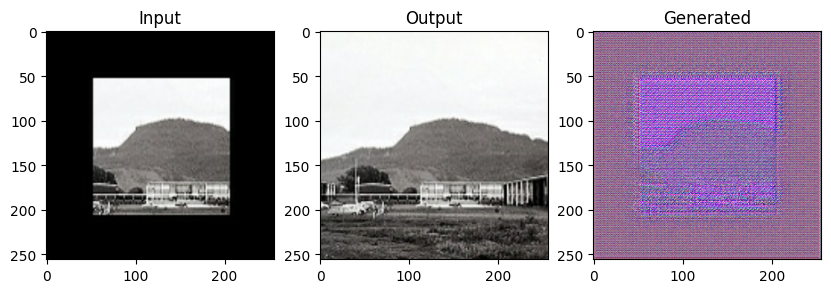

In [38]:
display_images(generator.model, input_image, output_image)

In [39]:
import datetime
import time

In [40]:
log_dir="../logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

checkpoint_dir = '../training_checkpoints_' + str(blackout_area_type)
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator.optimizer,
                                 discriminator_optimizer=discriminator.optimizer,
                                 generator=generator.model,
                                 discriminator=discriminator.model)

In [41]:
def train_step(input_image, output_image, generator, discriminator, step):
    with tf.GradientTape() as generator_tape, tf.GradientTape() as discriminator_tape:
        
        generator_model = generator.model
        discriminator_model = discriminator.model
        
        generated_image = generator_model(input_image[tf.newaxis, ...], training=True)
        discriminator_real_output = discriminator_model([input_image[tf.newaxis, ...], output_image[tf.newaxis, ...]], training=True)
        discriminator_generated_output = discriminator_model([input_image[tf.newaxis, ...], generated_image], training=True)
    
        generator_loss, cross_entropy_loss, l1_loss = generator.loss(discriminator_generated_output, generated_image, output_image)
        discriminator_loss = discriminator.loss(discriminator_real_output, discriminator_generated_output)
    
    generator_gradients = generator_tape.gradient(generator_loss, generator_model.trainable_variables)
    discriminator_gradients = discriminator_tape.gradient(discriminator_loss, discriminator_model.trainable_variables)
    
    generator.optimizer.apply_gradients(zip(generator_gradients, generator_model.trainable_variables))
    discriminator.optimizer.apply_gradients(zip(discriminator_gradients, discriminator_model.trainable_variables))
    
    with summary_writer.as_default():
        tf.summary.scalar('generator_loss', generator_loss, step=step // 1000)
        tf.summary.scalar('cross_entropy_loss', cross_entropy_loss, step=step // 1000)
        tf.summary.scalar('l1_loss', l1_loss, step=step // 1000)
        tf.summary.scalar('discriminator_loss', discriminator_loss, step=step // 1000)

In [42]:
def fit(train_images, test_images, generator, discriminator, steps):
    example_input, example_output = next(iter(test_images.take(1)))
    start = time.time()

    for step, (input_image, output_image) in train_images.repeat().take(steps).enumerate():
        if (step) % 1000 == 0:
            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

            start = time.time()
            
            display_images(generator.model, example_input, example_output)
            print(f"Step: {step//1000}k")

        train_step(input_image, output_image, generator, discriminator, step)
        
        if (step + 1) % 10 == 0:
            print('.', end='', flush=True)            

        if (step + 1) % 5000 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

In [43]:
train_dataset = tf.data.experimental.from_list(train_images)
test_dataset = tf.data.experimental.from_list(test_images)

Step: 0k
....................................................................................................Time taken for 1000 steps: 123.75 sec

Step: 1k
....................................................................................................Time taken for 1000 steps: 115.96 sec

Step: 2k
....................................................................................................Time taken for 1000 steps: 114.47 sec

Step: 3k
....................................................................................................Time taken for 1000 steps: 117.89 sec

Step: 4k
....................................................................................................Time taken for 1000 steps: 120.32 sec

Step: 5k
....................................................................................................Time taken for 1000 steps: 117.61 sec

Step: 6k
....................................................................................................Tim

C:\Users\vukana\AppData\Local\Temp\ipykernel_17980\1327570332.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10, 7))


....................................................................................................Time taken for 1000 steps: 118.47 sec

Step: 21k
....................................................................................................Time taken for 1000 steps: 119.24 sec

Step: 22k
....................................................................................................Time taken for 1000 steps: 118.69 sec

Step: 23k
....................................................................................................Time taken for 1000 steps: 117.93 sec

Step: 24k
....................................................................................................Time taken for 1000 steps: 119.94 sec

Step: 25k
....................................................................................................Time taken for 1000 steps: 117.93 sec

Step: 26k
....................................................................................................Time t

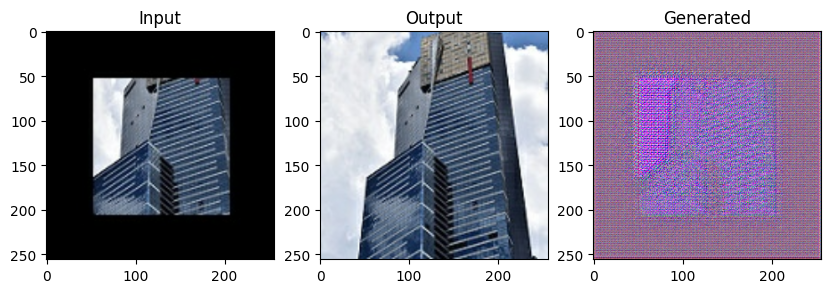

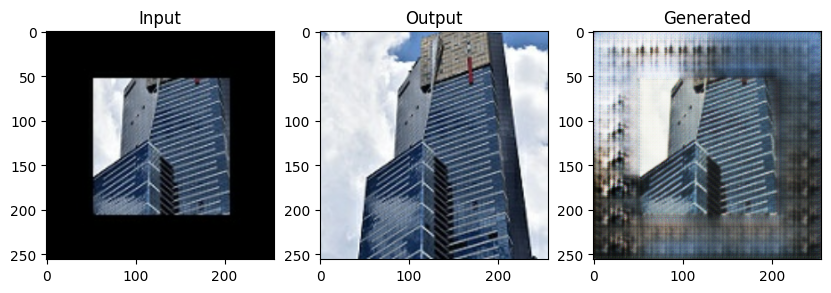

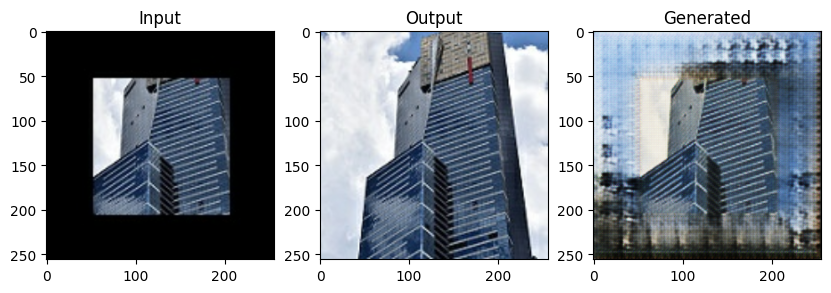

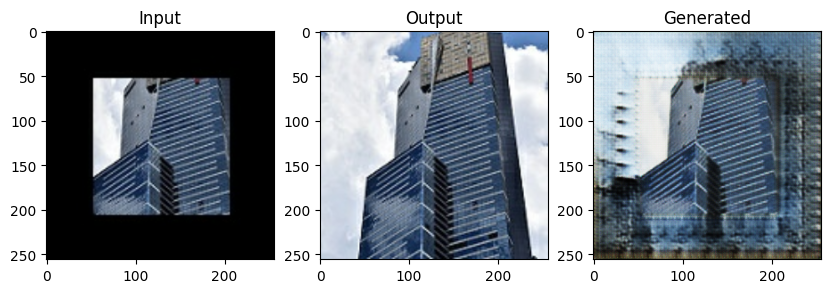

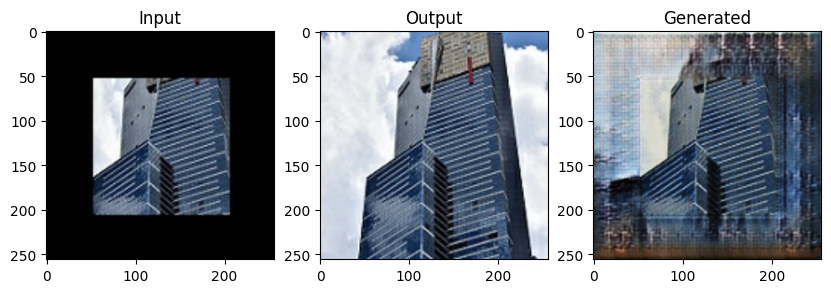

...

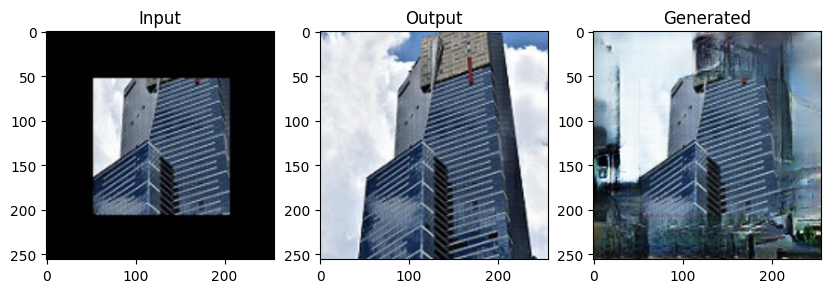

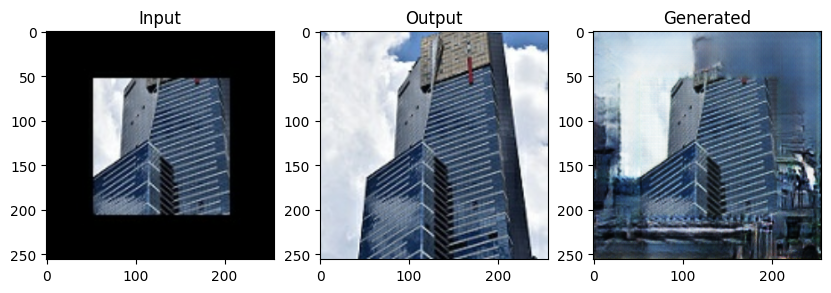

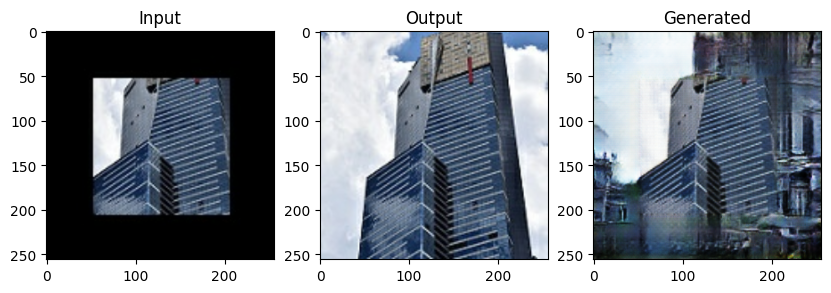

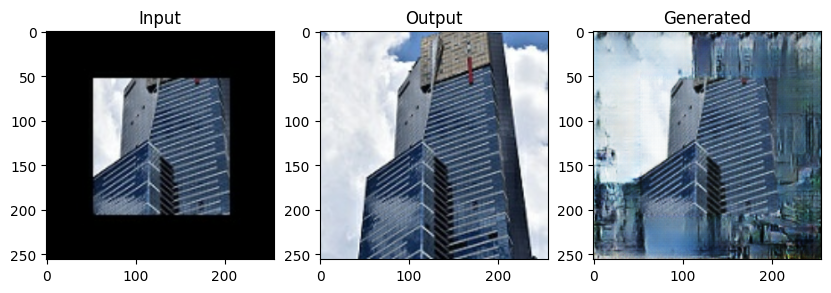

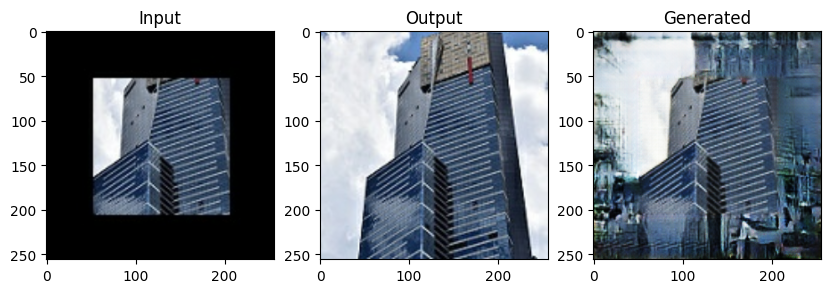

In [44]:
fit(train_dataset, test_dataset, generator, discriminator, steps=40000)

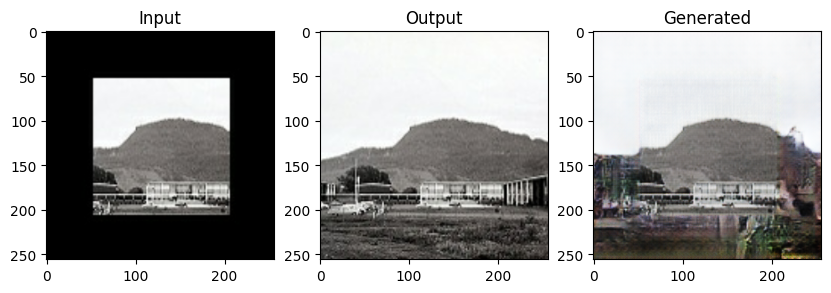

In [45]:
display_images(generator.model, input_image, output_image)

In [46]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

Reusing TensorBoard on port 6006 (pid 15992), started 2:48:52 ago. (Use '!kill 15992' to kill it.)